In [1]:
!pip install --upgrade kornia
!pip install --upgrade fastai

DEPRECATION: pytorch-lightning 1.5.4 has a non-standard dependency specifier torch>=1.7.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pytorch-lightning or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


DEPRECATION: pytorch-lightning 1.5.4 has a non-standard dependency specifier torch>=1.7.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pytorch-lightning or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [2]:
!pip install nibabel

DEPRECATION: pytorch-lightning 1.5.4 has a non-standard dependency specifier torch>=1.7.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pytorch-lightning or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [3]:
import os
import glob
import cv2
import imageio

import numpy as np 
import pandas as pd 
import nibabel as nib
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm
from ipywidgets import *
from PIL import Image
from matplotlib.pyplot import figure

from fastai.basics import *
from fastai.vision.all import *
from fastai.data.transforms import *

D:\ML\Lib\site-packages\torch\cuda\__init__.py:749: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 9010). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at C:\cb\pytorch_1000000000000\work\c10\cuda\CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() if nvml_count < 0 else nvml_count


In [4]:
# Create a meta file for nii files processing

file_list = []
for pt_folder in range(1, 6):
    for dirname, _, filenames in os.walk(f'D:/downloads/LITS/dataset/volume_pt{pt_folder}'):
        for filename in filenames:
            file_list.append((dirname, filename))

df_files = pd.DataFrame(file_list, columns=['dirname', 'filename'])
df_files.sort_values(by=['filename'], ascending=True, inplace=True)

In [5]:
# Map CT scan and label

df_files["mask_dirname"] = ""
df_files["mask_filename"] = ""

for i in range(131):
    volume = f"volume-{i}.nii"
    segmentation = f"segmentation-{i}.nii"

    df_files.loc[df_files['filename'] == volume, 'mask_filename'] = segmentation
    df_files.loc[df_files['filename'] == volume, 'mask_dirname'] = f"D:/downloads/LITS/dataset/segmentations"

# Drop rows where mask_filename is empty
df_files = df_files[df_files.mask_filename != ''].sort_values(by=['filename']).reset_index(drop=True)

print(df_files)

                                 dirname       filename  \
0   D:/downloads/LITS/dataset/volume_pt1   volume-0.nii   
1   D:/downloads/LITS/dataset/volume_pt1   volume-1.nii   
2   D:/downloads/LITS/dataset/volume_pt1  volume-10.nii   
3   D:/downloads/LITS/dataset/volume_pt2  volume-11.nii   
4   D:/downloads/LITS/dataset/volume_pt2  volume-12.nii   
5   D:/downloads/LITS/dataset/volume_pt2  volume-13.nii   
6   D:/downloads/LITS/dataset/volume_pt2  volume-14.nii   
7   D:/downloads/LITS/dataset/volume_pt2  volume-15.nii   
8   D:/downloads/LITS/dataset/volume_pt2  volume-16.nii   
9   D:/downloads/LITS/dataset/volume_pt2  volume-17.nii   
10  D:/downloads/LITS/dataset/volume_pt2  volume-18.nii   
11  D:/downloads/LITS/dataset/volume_pt2  volume-19.nii   
12  D:/downloads/LITS/dataset/volume_pt1   volume-2.nii   
13  D:/downloads/LITS/dataset/volume_pt2  volume-20.nii   
14  D:/downloads/LITS/dataset/volume_pt3  volume-21.nii   
15  D:/downloads/LITS/dataset/volume_pt3  volume-22.nii 

In [6]:
def read_nii(filepath):
    '''
    Reads .nii file and returns pixel array
    '''
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    return(array)

In [7]:
# Read sample

sample = 0
sample_ct = read_nii(df_files.loc[sample,'dirname']+"/"+df_files.loc[sample,'filename'])
sample_mask = read_nii(df_files.loc[sample,'mask_dirname']+"/"+df_files.loc[sample,'mask_filename'])

print(f'CT Shape:   {sample_ct.shape}\nMask Shape: {sample_mask.shape}')

CT Shape:   (512, 512, 75)
Mask Shape: (512, 512, 75)


In [8]:
print(np.amin(sample_ct), np.amax(sample_ct))
print(np.amin(sample_mask), np.amax(sample_mask))

-3024.0 1410.0
0.0 2.0


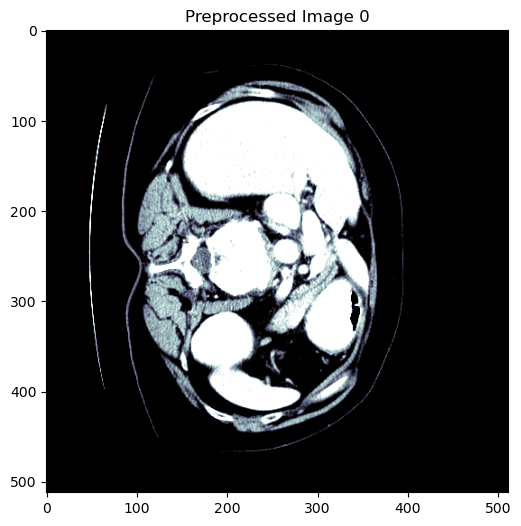

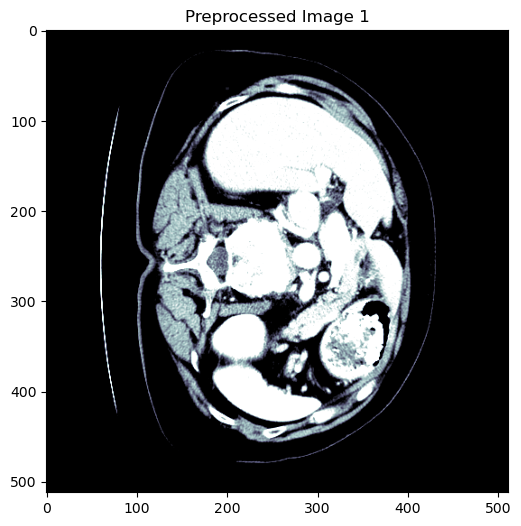

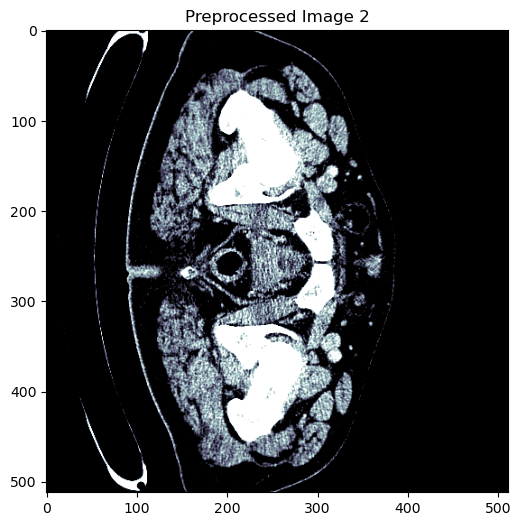

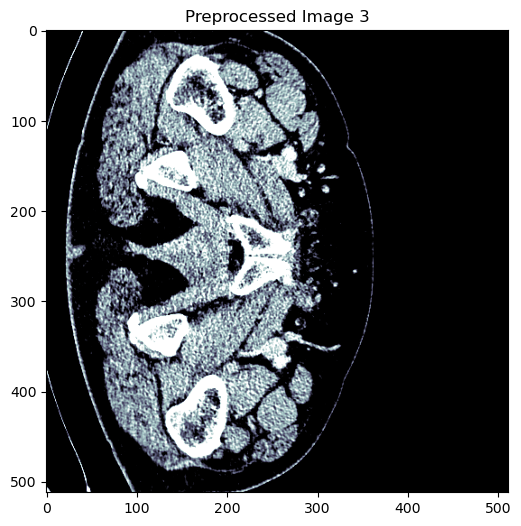

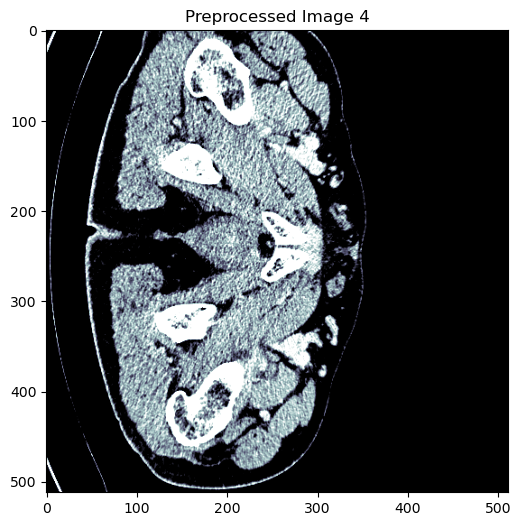

...

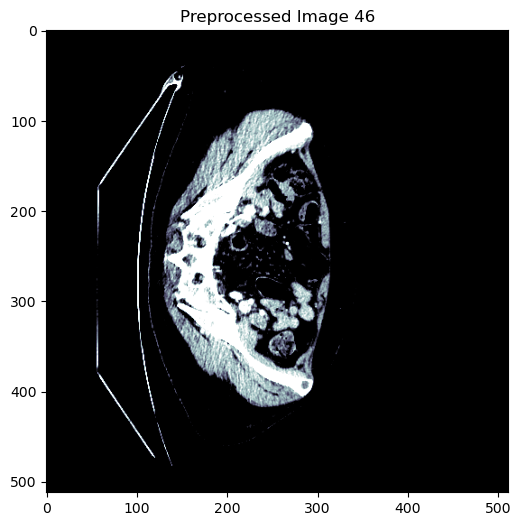

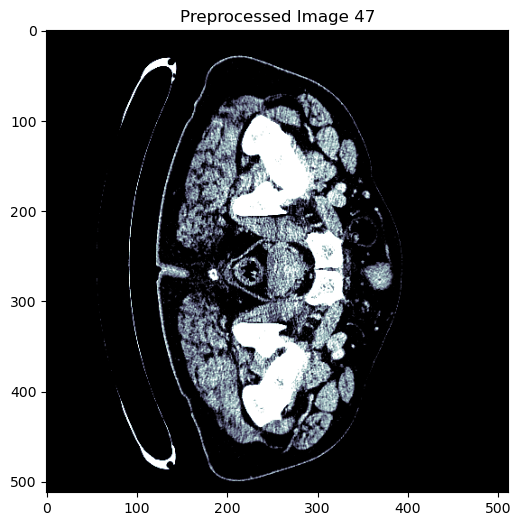

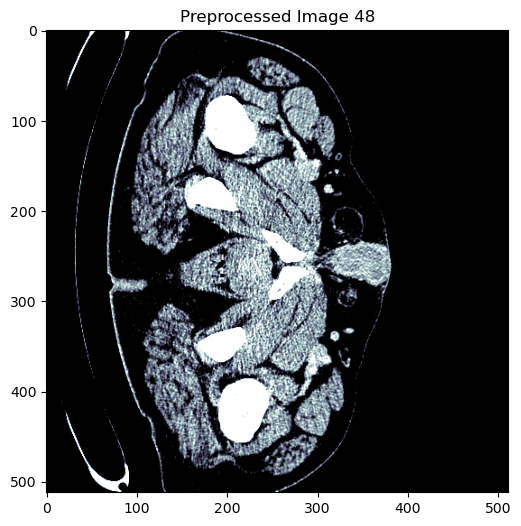

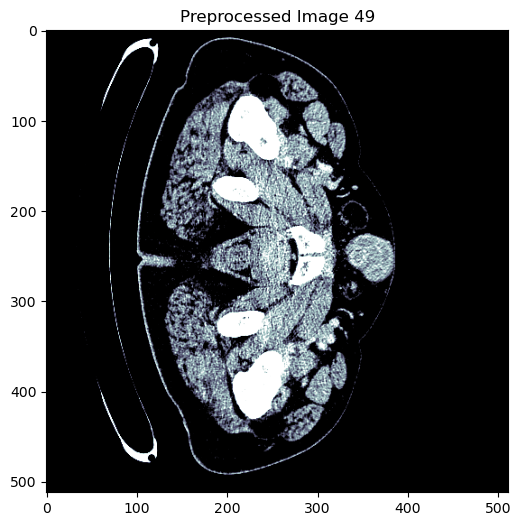

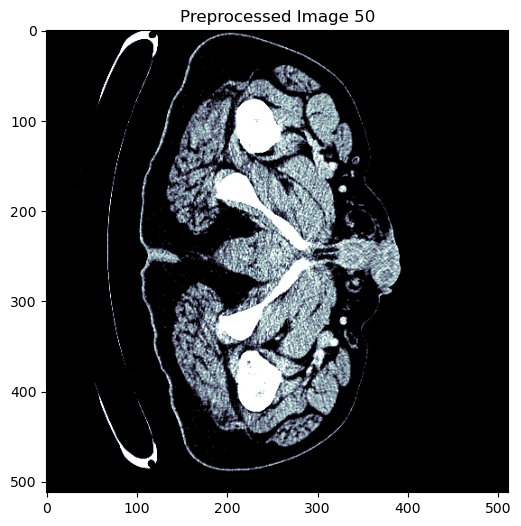

In [9]:
# Define the windowing parameters
dicom_windows = types.SimpleNamespace(
    liver=(150,30),
    # Add more window definitions if needed
)

# Define the windowed function
@patch
def windowed(self:Tensor, w, l):
    px = self.clone()
    px_min = l - w//2
    px_max = l + w//2
    px[px<px_min] = px_min
    px[px>px_max] = px_max
    return (px-px_min) / (px_max-px_min)

# Load and preprocess NII files
for idx, row in df_files.iterrows():
    # Load NII file
    nii_path = os.path.join(row['dirname'], row['filename'])
    img = np.array(nib.load(nii_path).dataobj)

    # Apply windowing
    windowed_img = tensor(img.astype(np.float32)).windowed(*dicom_windows.liver)

    # Visualize the preprocessed image (optional)
    plt.figure(figsize=(8, 6), dpi=100)
    plt.imshow(windowed_img[..., 55], cmap=plt.cm.bone)
    plt.title(f'Preprocessed Image {idx}')
    plt.show()

    # Save or further process the preprocessed image as needed

In [10]:
def plot_sample(array_list, color_map = 'nipy_spectral'):
    '''
    Plots and a slice with all available annotations
    '''
    fig = plt.figure(figsize=(20,16), dpi=100)

    plt.subplot(1,4,1)
    plt.imshow(array_list[0], cmap='bone')
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1,4,2)
    plt.imshow(tensor(array_list[0].astype(np.float32)).windowed(*dicom_windows.liver), cmap='bone');
    plt.title('Windowed Image')
    plt.axis('off')
             
    plt.subplot(1,4,3)
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Mask')
    plt.axis('off')
    
    plt.subplot(1,4,4)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Liver & Mask')
    plt.axis('off')
    
    plt.show()

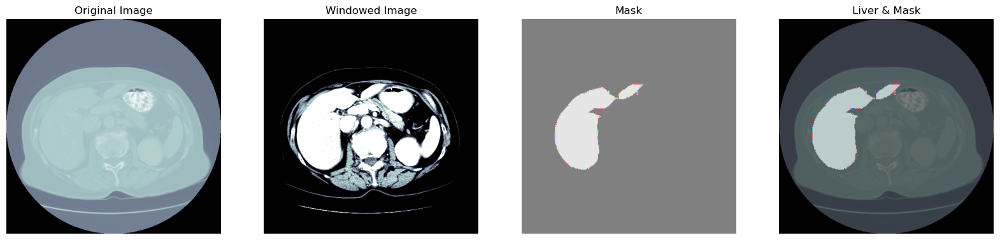

In [11]:
sample = 55

sample_slice = tensor(sample_ct[...,sample].astype(np.float32))

plot_sample([sample_ct[..., sample],
             sample_mask[..., sample]])

In [12]:
# Check the mask values
mask = Image.fromarray(sample_mask[...,sample].astype('uint8'), mode="L")
unique, counts = np.unique(mask, return_counts=True)
print(np.array((unique, counts)).T)

[[     0 244111]
 [     1  18033]]


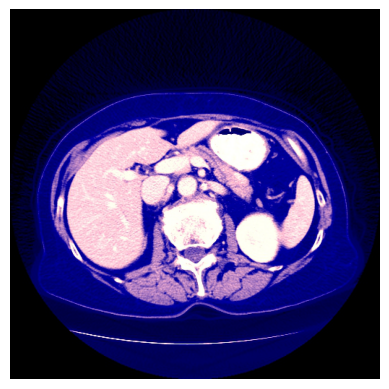

In [15]:
from PIL import Image
from matplotlib import pyplot as plt
from fastai.vision.all import *
import torch

# Define Tensor subclass for CT scans
class TensorCTScan(TensorImageBW):
    _show_args = {'cmap': 'bone'}

# Patching the frequency histogram bins function
@patch
def freqhist_bins(self:Tensor, n_bins=100):
    imsd = self.view(-1).sort()[0]
    t = torch.cat([tensor([0.001]),
                   torch.arange(n_bins).float()/n_bins+(1/2/n_bins),
                   tensor([0.999])])
    t = (len(imsd)*t).long()
    return imsd[t].unique()

# Patching the histogram scaling function
@patch
def hist_scaled(self:Tensor, brks=None):
    if self.device.type == 'cuda': return self.hist_scaled_pt(brks)
    if brks is None: brks = self.freqhist_bins()
    ys = np.linspace(0., 1., len(brks))
    x = self.numpy().flatten()
    x = np.interp(x, brks.numpy(), ys)
    return tensor(x).reshape(self.shape).clamp(0., 1.)

# Patching the to_nchan function
@patch
def to_nchan(x:Tensor, wins, bins=None):
    res = [x.windowed(*win) for win in wins]
    if not isinstance(bins, int) or bins != 0:
        res.append(x.hist_scaled(bins).clamp(0, 1))
    dim = [0, 1][x.dim() == 3]
    return TensorCTScan(torch.stack(res, dim=dim))

# Patching the save_jpg function
@patch
def save_jpg(x:(Tensor), path, wins, bins=None, quality=120):
    fn = Path(path).with_suffix('.jpg')
    x = (x.to_nchan(wins, bins) * 255).byte()
    im = Image.fromarray(x.permute(1, 2, 0).numpy(), mode=['RGB', 'CMYK'][x.shape[0] == 4])
    im.save(fn, quality=quality)

# Define the plot_sample function
def plot_sample(array_list, color_map='nipy_spectral'):
    fig = plt.figure(figsize=(20, 16), dpi=100)

    plt.subplot(1, 4, 1)
    plt.imshow(array_list[0], cmap='bone')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(tensor(array_list[0].astype(np.float32)).windowed(*dicom_windows.liver), cmap='bone');
    plt.title('Windowed Image')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Mask')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Liver & Mask')
    plt.axis('off')

    plt.show()

# Define window parameters
dicom_windows = types.SimpleNamespace(
    liver=(150,30),
    custom=(200,60)  # Add any additional window definitions as needed
)

# Save the sample slice as jpg
sample_slice.save_jpg('test.jpg', [dicom_windows.liver, dicom_windows.custom])

# Load the saved image and display
img = Image.open('test.jpg')
plt.imshow(img)
plt.axis('off')
plt.show()


In [17]:
#show_image(Image.open('test.jpg'), ax=axs[0], figsize=(8, 6))

In [18]:
GENERATE_JPG_FILES = True

if GENERATE_JPG_FILES:
    # Define window parameters
    dicom_windows = types.SimpleNamespace(
        liver=(150,30),
        custom=(200,60)  # Add any additional window definitions as needed
    )

    # Create directories if they don't exist
    os.makedirs('train_images', exist_ok=True)
    os.makedirs('train_masks', exist_ok=True)

    for ii in tqdm(range(0, len(df_files), 3)):  # take 1/3 nii files for training
        curr_ct = read_nii(df_files.loc[ii, 'dirname'] + "/" + df_files.loc[ii, 'filename'])
        curr_mask = read_nii(df_files.loc[ii, 'mask_dirname'] + "/" + df_files.loc[ii, 'mask_filename'])
        curr_file_name = str(df_files.loc[ii, 'filename']).split('.')[0]
        curr_dim = curr_ct.shape[2]  # 512, 512, curr_dim

        for curr_slice in range(0, curr_dim, 2):  # export every 2nd slice for training
            data = tensor(curr_ct[..., curr_slice].astype(np.float32))
            mask = Image.fromarray(curr_mask[..., curr_slice].astype('uint8'), mode="L")
            data.save_jpg(f"train_images/{curr_file_name}_slice_{curr_slice}.jpg", [dicom_windows.liver, dicom_windows.custom])
            mask.save(f"train_masks/{curr_file_name}_slice_{curr_slice}_mask.png")
else:
    path = Path("../input/liver-segmentation-with-fastai-v2")  # read jpg from saved kernel output


  0%|          | 0/17 [00:00<?, ?it/s]

In [21]:
# Model Training
BATCH_SIZE = 16
IMAGE_SIZE = 128

#path= Path("D:/downloads/LITS/dataset")
# Define label codes

# Define the path to the directory containing training images and masks
path = Path(".")

codes = np.array(["background", "liver", "tumor"])

# Define functions for getting x (input image) and y (mask)
def get_x(fname:Path): return fname
def label_func(x): return path/'train_masks'/f'{x.stem}_mask.png'

# Define transformations
tfms = [IntToFloatTensor(), Normalize()]

# Define DataBlock
db = DataBlock(blocks=(ImageBlock(), MaskBlock(codes)),
               batch_tfms=tfms,
               splitter=RandomSplitter(),
               item_tfms=[Resize(IMAGE_SIZE)],
               get_items=get_image_files,
               get_y=label_func)

# Create datasets
ds = db.datasets(source=path/'train_images')

# Create dataloaders
dls = db.dataloaders(source=path/'train_images', bs=BATCH_SIZE)


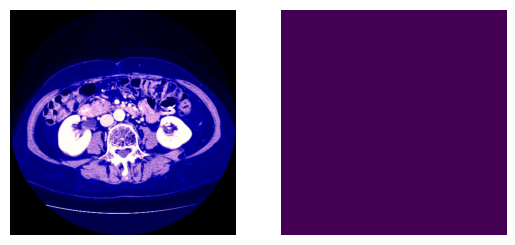

In [22]:
idx = 20
imgs = [ds[idx][0], ds[idx][1]]  # Accessing the input image and its corresponding mask
fig, axs = plt.subplots(1, 2)

for i, ax in enumerate(axs.flatten()):
    ax.axis('off')
    ax.imshow(imgs[i])

plt.show()

In [23]:
# Ensure ds is properly defined and accessible in the current scope
# Assuming ds is defined as the dataset created using the DataBlock

# Get the segmentation mask from the dataset at index idx
seg_mask = ds[idx][1]

# Count the occurrences of unique values in the segmentation mask
unique, counts = np.unique(seg_mask, return_counts=True)

# Print the unique values and their counts
print(np.array((unique, counts)).T)


[[     0 262144]]


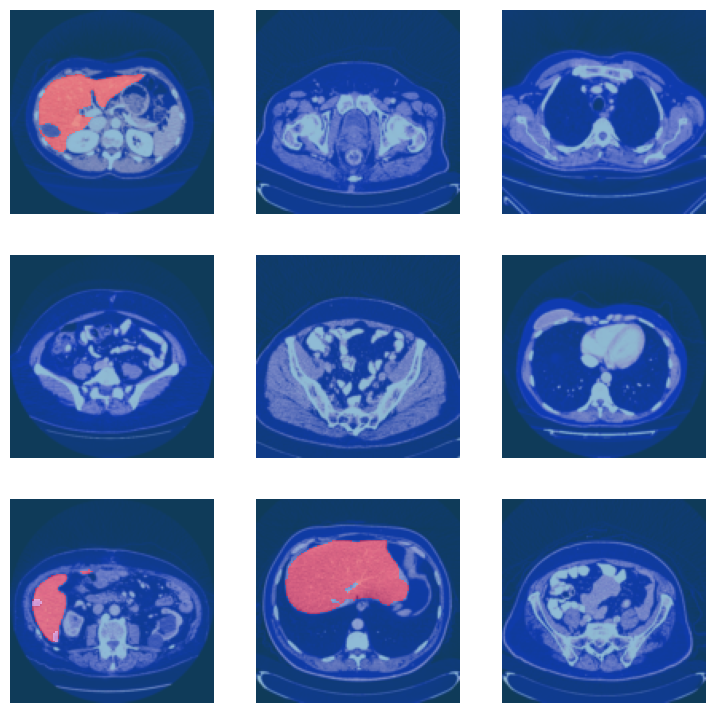

In [24]:
dls = db.dataloaders(source=path/'train_images', bs=BATCH_SIZE)
dls.show_batch()

In [28]:
def foreground_acc(inp, targ, bkg_idx=0, axis=1):  # exclude a background from metric
    "Computes non-background accuracy for multiclass segmentation"
    targ = targ.squeeze(1)
    mask = targ != bkg_idx
    return (inp.argmax(dim=axis)[mask]==targ[mask]).float().mean() 

def cust_foreground_acc(inp, targ):  # # include a background into the metric
    return foreground_acc(inp=inp, targ=targ, bkg_idx=3, axis=1) # 3 is a dummy value to include the background which is 0

In [29]:
learn = unet_learner(dls,
                     resnet50,
                     loss_func=CrossEntropyLossFlat(axis=1),
                     metrics=[foreground_acc, cust_foreground_acc]) 

In [30]:
learn.fit_one_cycle(1, wd=0.1, cbs=SaveModelCallback())

epoch,train_loss,valid_loss,foreground_acc,cust_foreground_acc,time
0,0.019741,0.010350,0.924339,0.996437,3:11:54


Better model found at epoch 0 with valid_loss value: 0.010349852964282036.


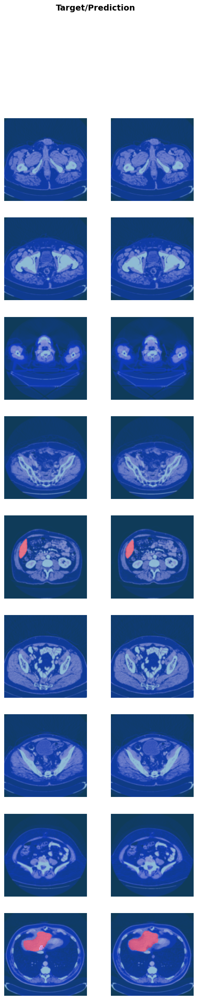

In [31]:
learn.show_results()

In [32]:
# Save the model
learn.export('liver_segmentation_resnet50.pkl')

In [34]:
# Load saved model
if (GENERATE_JPG_FILES) :
    
    tfms = [Resize(IMAGE_SIZE), IntToFloatTensor(),Normalize()]
    learn0 = load_learner(path/f'liver_segmentation_resnet50.pkl',cpu=False )
    learn0.dls.transform = tfms

In [35]:
def nii_tfm(fn,wins): 

    test_nii  = read_nii(fn)
    curr_dim  = test_nii.shape[2] # 512, 512, curr_dim
    slices = []
    
    for curr_slice in range(curr_dim):
        data = tensor(test_nii[...,curr_slice].astype(np.float32))
        data = (data.to_nchan(wins)*255).byte()
        slices.append(TensorImage(data))
                      
    return slices 

In [36]:
tst = 20

test_nii   = read_nii(df_files.loc[tst,'dirname']+"/"+df_files.loc[tst,'filename'])
test_mask  = read_nii(df_files.loc[tst,'mask_dirname']+"/"+df_files.loc[tst,'mask_filename'])
print(test_nii.shape)

test_slice_idx = 500

sample_slice = tensor(test_nii[...,test_slice_idx].astype(np.float32))

plot_sample([test_nii[...,test_slice_idx], test_mask[...,test_slice_idx]])

MemoryError: Unable to allocate 1.68 GiB for an array with shape (512, 512, 861) and data type float64

In [ ]:
# Prepare a nii test file for prediction 

test_files = nii_tfm(df_files.loc[tst,'dirname']+"/"+df_files.loc[tst,'filename'],[dicom_windows.liver, dicom_windows.custom])
print("Number of test slices: ", len(test_files))

In [ ]:
# Check an input for a test file
show_image(test_files[test_slice_idx])

In [ ]:
# Get predictions for a Test file

test_dl = learn0.dls.test_dl(test_files)
preds, y = learn0.get_preds(dl=test_dl)

predicted_mask = np.argmax(preds, axis=1)

plt.imshow(predicted_mask[test_slice_idx])